In [ ]:
#LOADING THE  LIBRARY
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
 #LOADING THE DATASET
df = pd.read_csv('/kaggle/input/credit-score-classification/train.csv')

In [ ]:

df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [ ]:
#LENGHT OF DATASET
df.shape

(100000, 28)

In [ ]:
df.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

In [ ]:
df = df.drop(['ID','Customer_ID','Name','SSN','Month','Monthly_Inhand_Salary','Monthly_Inhand_Salary','Type_of_Loan','Num_of_Delayed_Payment','Credit_History_Age','Amount_invested_monthly'],axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 100000 entries, 0 to 99999

Data columns (total 18 columns):

 #   Column                    Non-Null Count   Dtype  

---  ------                    --------------   -----  

 0   Age                       100000 non-null  object 

 1   Occupation                100000 non-null  object 

 2   Annual_Income             100000 non-null  object 

 3   Num_Bank_Accounts         100000 non-null  int64  

 4   Num_Credit_Card           100000 non-null  int64  

 5   Interest_Rate             100000 non-null  int64  

 6   Num_of_Loan               100000 non-null  object 

 7   Delay_from_due_date       100000 non-null  int64  

 8   Changed_Credit_Limit      100000 non-null  object 

 9   Num_Credit_Inquiries      98035 non-null   float64

 10  Credit_Mix                100000 non-null  object 

 11  Outstanding_Debt          100000 non-null  object 

 12  Credit_Utilization_Ratio  100000 non-null  float64

 13  Payment_of_Min_Amount     1

In [ ]:
df.isnull().sum()

Age                            0
Occupation                     0
Annual_Income                  0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Changed_Credit_Limit           0
Num_Credit_Inquiries        1965
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Payment_Behaviour              0
Monthly_Balance             1200
Credit_Score                   0
dtype: int64

In [ ]:
Categorical_Col = []
Numerical_Col = []

In [ ]:
for col in df.columns:
    if df[col].dtype == 'object':
        Categorical_Col.append(col)
    else:
        Numerical_Col.append(col)

In [ ]:
Categorical_Col

['Age',
 'Occupation',
 'Annual_Income',
 'Num_of_Loan',
 'Changed_Credit_Limit',
 'Credit_Mix',
 'Outstanding_Debt',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Monthly_Balance',
 'Credit_Score']

In [ ]:
Numerical_Col

['Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Delay_from_due_date',
 'Num_Credit_Inquiries',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month']

In [ ]:
for col in Categorical_Col:
    print(df[col].unique())

['23' '-500' '28_' ... '4808_' '2263' '1342']

['Scientist' '_______' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer'

 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant'

 'Musician' 'Mechanic' 'Writer' 'Architect']

['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_']

['4' '1' '3' '967' '-100' '0' '0_' '2' '3_' '2_' '7' '5' '5_' '6' '8' '8_'

 '9' '9_' '4_' '7_' '1_' '1464' '6_' '622' '352' '472' '1017' '945' '146'

 '563' '341' '444' '720' '1485' '49' '737' '1106' '466' '728' '313' '843'

 '597_' '617' '119' '663' '640' '92_' '1019' '501' '1302' '39' '716' '848'

 '931' '1214' '186' '424' '1001' '1110' '1152' '457' '1433' '1187' '52'

 '1480' '1047' '1035' '1347_' '33' '193' '699' '329' '1451' '484' '132'

 '649' '995' '545' '684' '1135' '1094' '1204' '654' '58' '348' '614'

 '1363' '323' '1406' '1348' '430' '153' '1461' '905' '1312' '1424' '1154'

 '95' '1353' '1228' '819' '1006' '795' '359' '1209' '590' '696' '1185_'

 '1465' '911' '1181' '

In [ ]:
df['Age'] = df['Age'].str.replace('-','')
df['Age'] = df['Age'].str.replace('_','')
df['Age'] = df['Age'].astype(int)

In [ ]:
df['Occupation'] = df['Occupation'].str.replace('_______','Unknown')

In [ ]:
df['Annual_Income'] = df['Annual_Income'].str.replace('-','')
df['Annual_Income'] = df['Annual_Income'].str.replace('_','')
df['Annual_Income'] = df['Annual_Income'].astype(float)

In [ ]:
df['Num_of_Loan'] = df['Num_of_Loan'].str.replace('-','')
df['Num_of_Loan'] = df['Num_of_Loan'].str.replace('_','')
df['Num_of_Loan'] = df['Num_of_Loan'].astype(int)

In [ ]:
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].str.replace('_','0')
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].astype(float)

In [ ]:
df['Credit_Mix'] = df['Credit_Mix'].str.replace('_','Unknown')

In [ ]:
df['Outstanding_Debt'] = df['Outstanding_Debt'].str.replace('-','')
df['Outstanding_Debt'] = df['Outstanding_Debt'].str.replace('_','')
df['Outstanding_Debt'] = df['Outstanding_Debt'].astype(float)

In [ ]:
df['Monthly_Balance'] = df['Monthly_Balance'].str.replace('-','')
df['Monthly_Balance'] = df['Monthly_Balance'].str.replace('_','')
df['Monthly_Balance'] = df['Monthly_Balance'].astype(float)

In [ ]:
df['Payment_Behaviour'] = df['Payment_Behaviour'].str.replace('!@9#%8','Unknown')

In [ ]:
Categorical_Col = []
Numerical_Col = []

In [ ]:
for col in df.columns:
    if df[col].dtype == 'object':
        Categorical_Col.append(col)
    else:
        Numerical_Col.append(col)

In [ ]:
Categorical_Col

['Occupation',
 'Credit_Mix',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Credit_Score']

In [ ]:
Numerical_Col

['Age',
 'Annual_Income',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month',
 'Monthly_Balance']

In [ ]:
for col in Categorical_Col:
    print(df[col].unique())

['Scientist' 'Unknown' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer'

 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant'

 'Musician' 'Mechanic' 'Writer' 'Architect']

['Unknown' 'Good' 'Standard' 'Bad']

['No' 'NM' 'Yes']

['High_spent_Small_value_payments' 'Low_spent_Large_value_payments'

 'Low_spent_Medium_value_payments' 'Low_spent_Small_value_payments'

 'High_spent_Medium_value_payments' 'Unknown'

 'High_spent_Large_value_payments']

['Good' 'Standard' 'Poor']


In [ ]:
df.isnull().sum()

Age                            0
Occupation                     0
Annual_Income                  0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Changed_Credit_Limit           0
Num_Credit_Inquiries        1965
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Payment_Behaviour              0
Monthly_Balance             2868
Credit_Score                   0
dtype: int64

In [ ]:
Num_Credit_Inquiries_Mean = df['Num_Credit_Inquiries'].mean()
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].fillna(Num_Credit_Inquiries_Mean)

In [ ]:
Monthly_Balance_Mean = df['Monthly_Balance'].mean()
df['Monthly_Balance'] = df['Monthly_Balance'].fillna(Monthly_Balance_Mean)

In [ ]:
df.isnull().sum()

Age                         0
Occupation                  0
Annual_Income               0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

# Encoding
--> Label Encoding for the columns containing less than or equal to 3 categorical values

--> Frequency Encoding for the columns with more than 3 categorical values

In [ ]:
from sklearn.preprocessing import LabelEncoder
import category_encoders as ce

In [ ]:
LE = LabelEncoder()

In [ ]:
for col in Categorical_Col:
    if len(df[col].unique()) <= 3:
        df[col] = LE.fit_transform(df[col])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 100000 entries, 0 to 99999

Data columns (total 18 columns):

 #   Column                    Non-Null Count   Dtype  

---  ------                    --------------   -----  

 0   Age                       100000 non-null  int64  

 1   Occupation                100000 non-null  object 

 2   Annual_Income             100000 non-null  float64

 3   Num_Bank_Accounts         100000 non-null  int64  

 4   Num_Credit_Card           100000 non-null  int64  

 5   Interest_Rate             100000 non-null  int64  

 6   Num_of_Loan               100000 non-null  int64  

 7   Delay_from_due_date       100000 non-null  int64  

 8   Changed_Credit_Limit      100000 non-null  float64

 9   Num_Credit_Inquiries      100000 non-null  float64

 10  Credit_Mix                100000 non-null  object 

 11  Outstanding_Debt          100000 non-null  float64

 12  Credit_Utilization_Ratio  100000 non-null  float64

 13  Payment_of_Min_Amount     1

In [ ]:
count_encoding = df['Occupation'].value_counts()
df['Occupation_encoded'] = df['Occupation'].map(count_encoding)
df.drop(columns='Occupation',axis=1,inplace=True)

In [ ]:
count_encoding = df['Credit_Mix'].value_counts()
df['Credit_Mix_encoded'] = df['Credit_Mix'].map(count_encoding)
df.drop(columns='Credit_Mix',axis=1,inplace=True)

In [ ]:
count_encoding = df['Payment_Behaviour'].value_counts()
df['Payment_Behaviour_encoded'] = df['Payment_Behaviour'].map(count_encoding)
df.drop(columns='Payment_Behaviour',axis=1,inplace=True)

In [ ]:
df.head()

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Monthly_Balance,Credit_Score,Occupation_encoded,Credit_Mix_encoded,Payment_Behaviour_encoded
0,23,19114.12,3,4,3,4,3,11.27,4.0,809.98,26.822620,1,49.574949,312.494089,0,6299,20195,11340
1,23,19114.12,3,4,3,4,-1,11.27,4.0,809.98,31.944960,1,49.574949,284.629162,0,6299,24337,10425
2,500,19114.12,3,4,3,4,3,0.00,4.0,809.98,28.609352,1,49.574949,331.209863,0,6299,24337,13861
3,23,19114.12,3,4,3,4,5,6.27,4.0,809.98,31.377862,1,49.574949,223.451310,0,6299,24337,25513
4,23,19114.12,3,4,3,4,6,11.27,4.0,809.98,24.797347,1,49.574949,341.489231,0,6299,24337,17540


# Data Visualization

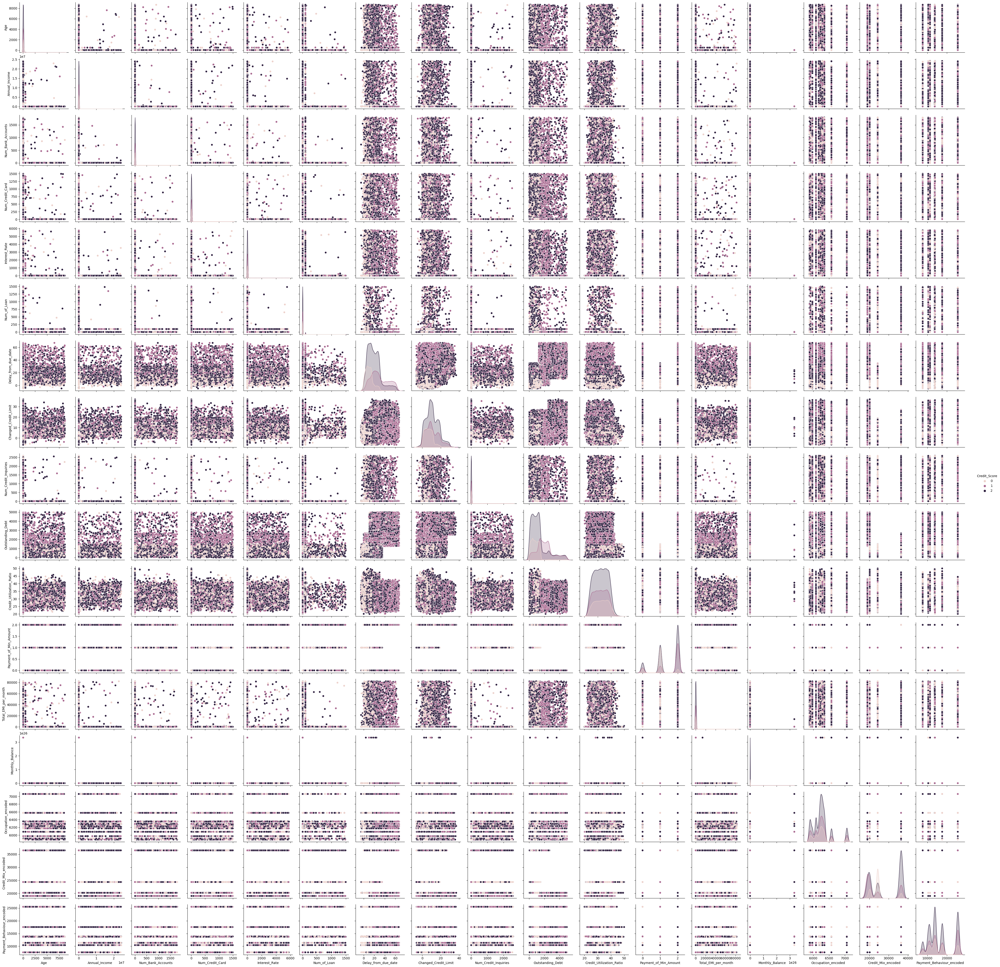

In [ ]:
sns.pairplot(df,hue='Credit_Score')
plt.show()

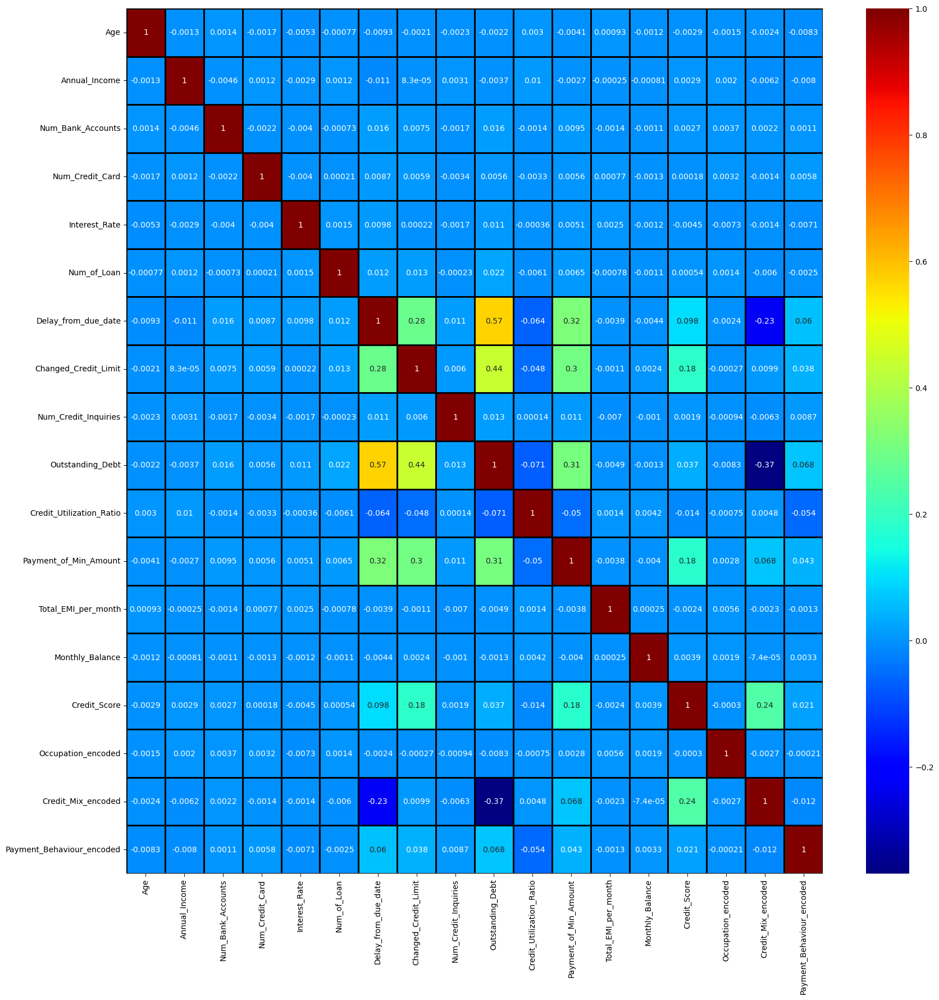

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,cmap='jet',linecolor='black',linewidth=1)
plt.show()

# Train & Test Split

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = df.drop(columns='Credit_Score',axis=1)
X

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Monthly_Balance,Occupation_encoded,Credit_Mix_encoded,Payment_Behaviour_encoded
0,23,19114.12,3,4,3,4,3,11.27,4.0,809.98,26.822620,1,49.574949,3.124941e+02,6299,20195,11340
1,23,19114.12,3,4,3,4,-1,11.27,4.0,809.98,31.944960,1,49.574949,2.846292e+02,6299,24337,10425
2,500,19114.12,3,4,3,4,3,0.00,4.0,809.98,28.609352,1,49.574949,3.312099e+02,6299,24337,13861
3,23,19114.12,3,4,3,4,5,6.27,4.0,809.98,31.377862,1,49.574949,2.234513e+02,6299,24337,25513
4,23,19114.12,3,4,3,4,6,11.27,4.0,809.98,24.797347,1,49.574949,3.414892e+02,6299,24337,17540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,25,39628.99,4,6,7,2,23,11.50,3.0,502.38,34.663572,1,35.104023,3.088580e+22,6291,20195,13721
99996,25,39628.99,4,6,7,2,18,11.50,3.0,502.38,40.565631,1,35.104023,3.088580e+22,6291,20195,17540
99997,25,39628.99,4,6,5729,2,27,11.50,3.0,502.38,41.255522,1,35.104023,3.088580e+22,6291,24337,13721
99998,25,39628.99,4,6,7,2,20,11.50,3.0,502.38,33.638208,1,35.104023,3.088580e+22,6291,24337,10425


In [ ]:
y = df['Credit_Score']
y

0        0
1        0
2        0
3        0
4        0
        ..
99995    1
99996    1
99997    1
99998    2
99999    1
Name: Credit_Score, Length: 100000, dtype: int64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
RNF = RandomForestClassifier()

In [ ]:
RNF.fit(X_train,y_train)

RandomForestClassifier()

Prediction

In [ ]:
y_hat = RNF.predict(X_test)

# Model Evaluation

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
print(accuracy_score(y_test,y_hat))

0.7886


In [ ]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support



           0       0.74      0.72      0.73      3527

           1       0.79      0.80      0.79      5874

           2       0.81      0.81      0.81     10599



    accuracy                           0.79     20000

   macro avg       0.78      0.77      0.78     20000

weighted avg       0.79      0.79      0.79     20000




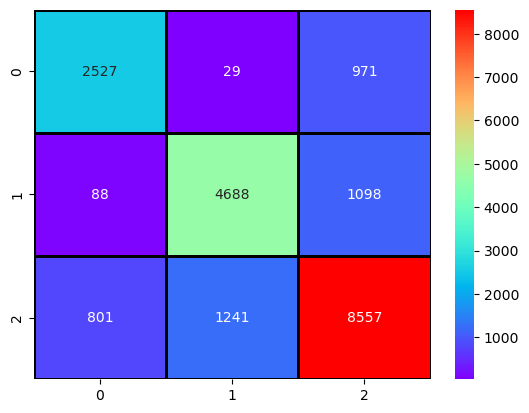

In [ ]:
sns.heatmap(confusion_matrix(y_test,y_hat),cmap='rainbow',fmt='d',annot=True,linewidths=1,linecolor='black')
plt.show()